**Problem Statement:**

**A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 
Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.
Today, microfinance is widely accepted as a poverty-reduction tool, representing 70 billion in outstanding loans and a global outreach of 200 million clients.
We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 
They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 
They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 
The sample data is provided to us from our client database. It is hereby given to you for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers**

In [2]:
#Importing required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
#loading dataset
data=pd.read_csv('Data file.csv')

In [4]:
pd.set_option('display.max_columns',None)

In [5]:
pd.set_option('display.max_rows',None)

In [6]:
#checking the overview of the dataset
data.head(2)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.05,3065.15,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.0,29.0,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.00,12124.75,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.0,0.0,UPW,2016-08-10


In [7]:
#checking shape
data.shape

(209593, 37)

**In this dataset there are about 2,09,593 rows and 37 columns present.**

In [8]:
#checking for null values
data.isna().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

**Null values are not there.**

In [9]:
#checkinf data types of the column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

**In this dataset, 21 columns have float type data, 13 columns have integer type data and 3 columns have object type data.**

In [10]:
#dropping unwanted column
data=data.drop(['Unnamed: 0'],axis=1)
data.head(2)

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,0,21408I70789,272.0,3055.05,3065.15,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.0,29.0,UPW,2016-07-20
1,1,76462I70374,712.0,12122.00,12124.75,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.0,0.0,UPW,2016-08-10


**Column Unnamed: 0 have been dropped from the dataset, as it contains only index values, so i dont find it important at the time of prediction.**

In [11]:
#checking duplicates
data.duplicated().sum()

1

**1 duplicate is there in the dataset.**

In [12]:
#dropping duplicates
data.drop_duplicates(inplace=True)
data.shape

(209592, 36)

In [13]:
#checking number of unique values
data.nunique()

label                        2
msisdn                  186243
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianamnt_loans90           6
payback3

# checking for unque values

In [148]:
#checking for unique values
for i in data:
    print(i)
    print(data[i].unique())
    print('\n')

label
[0 1]


msisdn
['21408I70789' '76462I70374' '17943I70372' ... '22758I85348' '59712I82733'
 '65061I85339']


aon
[2.72000000e+02 7.12000000e+02 5.35000000e+02 ... 8.03380622e+05
 5.81435484e+05 8.11881373e+05]


daily_decr30
[ 3055.05       12122.          1398.         ... 11843.11166667
 12488.22833333  4489.362     ]


daily_decr90
[ 3065.15       12124.75        1398.         ...   151.87233333
 12574.37        4534.82      ]


rental30
[ 220.13 3691.26  900.13 ... 5861.83  411.83  483.92]


rental90
[ 260.13 3691.26  900.13 ... 1728.36 8893.2   984.58]


last_rech_date_ma
[2.00000000e+00 2.00000000e+01 3.00000000e+00 ... 7.67980563e+05
 6.11678500e+05 5.90843122e+05]


last_rech_date_da
[0.00000000e+00 5.50000000e+01 6.30000000e+01 ... 8.09043117e+05
 7.99233445e+05 6.36529127e+05]


last_rech_amt_ma
[ 1539  5787   947  2309  3178   773  7526  1547   770     0  4048  8000
   173  1924  2320  4917  2593 10000  1720 11874  3193 16000  1333  4067
  3467  5814  7400  7560   777 1

**In this we can see that unique values present in each of the columns.**

In [128]:
#checking value counts
for i in data:
    print(i)
    print(data[i].value_counts())
    print('\n')

label
1    183430
0     26162
Name: label, dtype: int64


aon
 95.000000        392
 92.000000        362
 96.000000        357
 99.000000        356
 157.000000       349
 94.000000        348
 130.000000       346
 108.000000       346
 93.000000        340
 98.000000        339
 133.000000       338
 104.000000       337
 101.000000       333
 102.000000       333
 156.000000       332
 144.000000       330
 103.000000       329
 119.000000       329
 131.000000       327
 107.000000       327
 169.000000       327
 126.000000       326
 137.000000       325
 117.000000       325
 136.000000       324
 146.000000       323
 113.000000       323
 159.000000       323
 97.000000        322
 145.000000       322
 100.000000       322
 147.000000       320
 118.000000       320
 110.000000       319
 106.000000       318
 120.000000       318
 183.000000       318
 134.000000       317
 112.000000       317
 124.000000       316
 122.000000       316
 123.000000       314
 143.000000   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.0         27979
1539.0       9006
770.0        6040
773.0        4540
2309.0       4509
3078.0       4085
1540.0       3009
3848.0       2841
4617.0       2423
1547.0       2267
8000.0       2261
1546.0       1899
4048.0       1886
4618.0       1764
3079.0       1587
2310.0       1554
5387.0       1489
1924.0       1485
6156.0       1458
3178.0       1289
3086.0       1182
1543.0       1148
6157.0       1066
3080.0       1005
16000.0       945
3849.0        939
6926.0        920
5787.0        918
2319.0        881
2312.0        879
7695.0        879
2320.0        865
947.0         796
6927.0        794
7696.0        787
7526.0        704
3850.0        697
5388.0        695
5587.0        674
4619.0        658
2313.0        649
10000.0       623
4625.0        622
8096.0        611
6357.0        555
4717.0        551
9234.0        549
2316.0        545
8465.0        518
3082.0        504
3856.0        483
3092.0        478
5390.0        474
4620.0        464
8466.0        455
1720.0    

In [14]:
#Dropping unwanted columns
data=data.drop(['msisdn','pcircle'],axis=1)
data.head(2)

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate
0,0,272.0,3055.05,3065.15,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.0,29.0,2016-07-20
1,1,712.0,12122.00,12124.75,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.0,0.0,2016-08-10


**So we can see that column msisdn and pcicle have been dropped as columns msisdn only contains mobile numbers of the customers and column pcircle have only one unique value.So i have dropped this column.**

# By looking at the unique values and its values counts in most of the columns zero values are present. So checking the percentage of zero values present in each of the columns.

In [150]:
#checking for zeros in columns
zero_value=data.isin([0]).sum()/data.shape[0]*100
zero_value.sort_values(ascending=False)

fr_da_rech90            99.587293
fr_da_rech30            99.246632
cnt_da_rech30           98.037139
cnt_da_rech90           97.439311
last_rech_date_da       96.788045
medianamnt_loans90      94.193958
medianamnt_loans30      93.249742
payback30               50.914157
payback90               45.659663
fr_ma_rech30            37.541032
fr_ma_rech90            31.371904
medianmarechprebal30    14.637963
cnt_ma_rech30           13.349269
medianamnt_ma_rech30    13.349269
sumamnt_ma_rech30       13.349269
label                   12.482347
medianmarechprebal90    11.160254
last_rech_amt_ma        10.017081
medianamnt_ma_rech90     9.995611
sumamnt_ma_rech90        9.995611
cnt_ma_rech90            9.995611
last_rech_date_ma        9.896847
rental30                 3.609871
rental90                 3.300698
daily_decr30             1.977175
daily_decr90             1.938528
cnt_loans30              1.554926
amnt_loans30             1.554926
maxamnt_loans30          1.547769
amnt_loans90  

# Dropping columns in which zeroes are more than 90%

In [15]:
#droppimg column
data=data.drop(['fr_da_rech90','fr_da_rech30','cnt_da_rech30','cnt_da_rech90','last_rech_date_da','medianamnt_loans90','medianamnt_loans30'],axis=1)
data.head(2)

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,pdate
0,0,272.0,3055.05,3065.15,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.0,29.0,2016-07-20
1,1,712.0,12122.00,12124.75,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.0,0.0,2016-08-10


**So we can see that columns have been dropped in which zero values were more than 90%.**

In [16]:
#converting pdate data type from object to datetime
data.pdate=pd.to_datetime(data.pdate)

In [17]:
#extracting day
data['day']=data['pdate'].dt.day

In [18]:
#extracting month
data['month']=data['pdate'].dt.month

In [19]:
#extracting year
data['year']=data['pdate'].dt.year

In [20]:
#checking the dataset
data.head(2)

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,pdate,day,month,year
0,0,272.0,3055.05,3065.15,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.0,29.0,2016-07-20,20,7,2016
1,1,712.0,12122.00,12124.75,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.0,0.0,2016-08-10,10,8,2016


**So we can see that columns day, month and year have been added to the dataset.**

In [157]:
#checking unique values
data['day'].unique()

array([20, 10, 19,  6, 22,  2,  5, 15,  8, 12, 29, 16,  3, 24,  4,  1, 26,
       23,  9,  7, 27, 11, 30, 14, 21, 25, 28, 18, 13, 17, 31],
      dtype=int64)

In [158]:
#checking unique values
data['month'].unique()

array([7, 8, 6], dtype=int64)

In [159]:
#checking unique values
data['year'].unique()

array([2016], dtype=int64)

**So we can see that in column year only one unique values is there. so dropping column year as well pdate as we have already exxtracted the day and month from it.**

In [21]:
#dropping column
data=data.drop(['pdate','year'],axis=1)
data.head(2)

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,day,month
0,0,272.0,3055.05,3065.15,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.0,29.0,20,7
1,1,712.0,12122.00,12124.75,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.0,0.0,10,8


**So we can see that both the columns have been dropped from the dataset.**

In [161]:
#checking statistical summary of the dataset
data.describe().T

,count,mean,std,min,25%,50%,75%,max
label,209592.0,0.875177,0.330519,0.000000,1.000000,1.000000,1.0000,1.000000
aon,209592.0,8112.380399,75696.261220,-48.000000,246.000000,527.000000,982.0000,999860.755168
daily_decr30,209592.0,5381.412999,9220.644093,-93.012667,42.439500,1469.091833,7244.0960,265926.000000
daily_decr90,209592.0,6082.529123,10918.836919,-93.012667,42.691917,1500.000000,7802.7950,320630.000000
rental30,209592.0,2692.578912,4308.596841,-23737.140000,280.417500,1083.540000,3356.9450,198926.110000
rental90,209592.0,3483.407309,5770.475034,-24720.580000,300.260000,1334.000000,4201.7925,200148.110000
last_rech_date_ma,209592.0,3755.865715,53906.020204,-29.000000,1.000000,3.000000,7.0000,998650.377733
last_rech_amt_ma,209592.0,2064.458973,2370.790003,0.000000,770.000000,1539.000000,2309.0000,55000.000000
cnt_ma_rech30,209592.0,3.978053,4.256099,0.000000,1.000000,3.000000,5.0000,203.000000
fr_ma_rech30,209592.0,3737.372947,53643.752523,0.000000,0.000000,2.000000,6.0000,999606.368132


**By looking at the description of the dateset, i can see number of negative values which is present in the dataset whch has to be taken care by converting them from negative to positive. Secondly the data is not normally distributed, in most of the columns skewness will be present and by looking min, quantiles and max, alot of  outliers would be present.**

In [22]:
#converting negative values present columns into positive
data['aon']=abs(data['aon'])
data['daily_decr30']=abs(data['daily_decr30'])
data['daily_decr90']=abs(data['daily_decr90'])
data['rental30']=abs(data['rental30'])
data['rental90']=abs(data['rental90'])
data['last_rech_date_ma']=abs(data['last_rech_date_ma'])
data['medianmarechprebal30']=abs(data['medianmarechprebal30'])
data['medianmarechprebal90']=abs(data['medianmarechprebal90'])

In [163]:
#checking statistical summary of dataset
data.describe().T

,count,mean,std,min,25%,50%,75%,max
label,209592.0,0.875177,0.330519,0.0,1.000000,1.000000,1.0000,1.000000
aon,209592.0,8112.845675,75696.211355,1.0,246.000000,527.000000,982.0000,999860.755168
daily_decr30,209592.0,5381.442003,9220.627165,0.0,42.452250,1469.091833,7244.0960,265926.000000
daily_decr90,209592.0,6082.558196,10918.820723,0.0,42.693333,1500.000000,7802.7950,320630.000000
rental30,209592.0,2715.373669,4294.267480,0.0,299.700000,1095.740000,3362.3525,198926.110000
rental90,209592.0,3509.498048,5754.644314,0.0,330.000000,1347.210000,4204.5725,200148.110000
last_rech_date_ma,209592.0,3756.143760,53906.000830,0.0,1.000000,3.000000,7.0000,998650.377733
last_rech_amt_ma,209592.0,2064.458973,2370.790003,0.0,770.000000,1539.000000,2309.0000,55000.000000
cnt_ma_rech30,209592.0,3.978053,4.256099,0.0,1.000000,3.000000,5.0000,203.000000
fr_ma_rech30,209592.0,3737.372947,53643.752523,0.0,0.000000,2.000000,6.0000,999606.368132


**So we can see that negative values have been converted to positive one.**

# While checking for unique values and value count it came to my notice that, in column maxamt_loans30:maximum amount of loan taken by user in last 30 days.So only two loan were given that is 5(in Indonesian Rupiah) and 10(in Indonesian Rupiah) and for 5(in Indonesian Rupiah) payback amount is 6(in Indonesian Rupiah)and  for 10(in Indonesian Rupiah) payback amount is 12(in Indonesian Rupiah). And zero means no loan taken. Other than this are some other values in that column which cant be possible. So replacing that values into 0

In [23]:
#checking the data which have values other than 0,6 and 12 in column maxamnt_loans30
data.loc[(data['maxamnt_loans30']!=6)&(data['maxamnt_loans30']!=12)&(data['maxamnt_loans30']!=0),'maxamnt_loans30']

118       61907.697372
125       22099.413732
146       98745.934048
369       58925.364061
374       78232.464324
499       28574.830964
520       71532.935430
645       83207.495583
887       34044.361979
1091      43221.389235
1142       6041.731394
1201      27793.098567
1930      55723.858041
2030       6721.146132
2520      45683.595975
3073      56383.080492
3378      81942.467056
3751      86416.878765
3754      45073.630216
3879      37341.425477
4299      75689.411348
5868      14453.317604
5901      31906.326993
6078      30423.104698
6095      98416.189192
6139      92891.354661
6146      11721.237167
6205      59472.558915
6334      73539.025803
6897      64645.934675
7186      18091.746969
7355      81260.829943
7889      23483.269628
8122      19232.601189
8123      40618.875959
8204      81381.021186
8255      67464.429120
8303      89559.216166
9043      20338.052234
9188      13261.479515
9679      55523.246463
9793      51790.857423
10126     11466.779886
10151     1

In [24]:
#checking number of data which have values other than 0,6 and 12 in column maxamnt_loans30
len(data.loc[(data['maxamnt_loans30']!=6)&(data['maxamnt_loans30']!=12)&(data['maxamnt_loans30']!=0),'maxamnt_loans30'])

1047

**There are about 1047 values which is other than 0,6 and 12. So converting them into zeroes.**

In [25]:
#converting
data.loc[(data['maxamnt_loans30']!=6)&(data['maxamnt_loans30']!=12)&(data['maxamnt_loans30']!=0),'maxamnt_loans30']=0

In [167]:
#checking unique values
data['maxamnt_loans30'].unique()

array([ 6., 12.,  0.])

**So now we can see that only 6, 12 and 0 values are present in the dataset.**

In [168]:
#checking unique values
data['maxamnt_loans90'].unique()

array([ 6, 12,  0], dtype=int64)

In [169]:
#checking value count 
data['maxamnt_loans30'].value_counts()

6.0     179192
12.0     26109
0.0       4291
Name: maxamnt_loans30, dtype: int64

In [170]:
#checking value count 
data['maxamnt_loans90'].value_counts()

6     180944
12     26605
0       2043
Name: maxamnt_loans90, dtype: int64

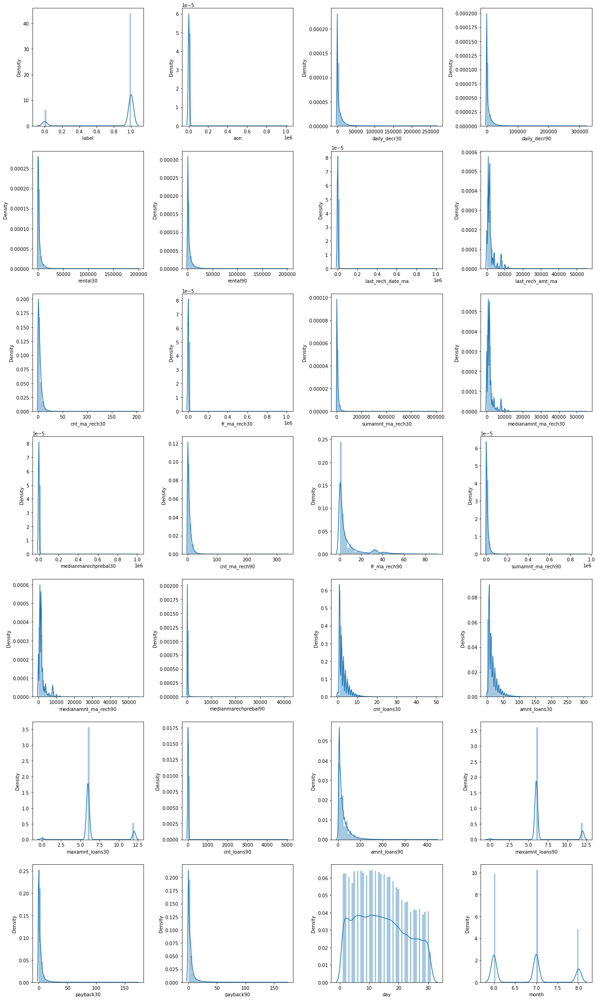

In [56]:
#plotting distribution plot
plt.figure(figsize=(18,30))
plotnumber=1
for column in data:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.tight_layout()

**Observation**
* **By looking at the above plots we can see that in most of the columns data is not distributed normally.**
* **In most of the columns data is skewed to right.So to cross verify further i will check the skewness and if the values are more than +0.5 or -0.5 than by using power transform method i will treat the skewness.**

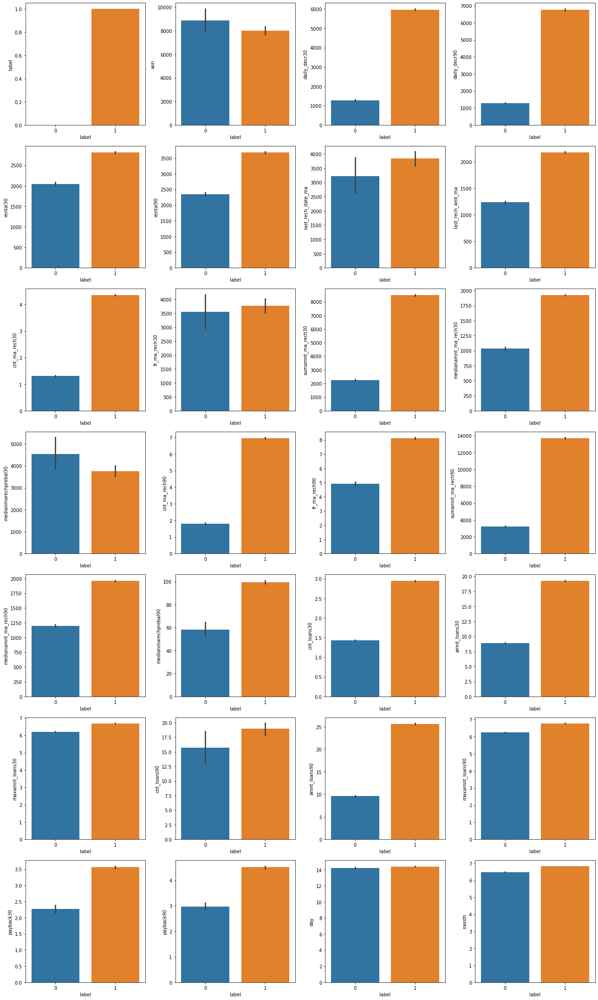

In [60]:
#plotting Bar  plots
plt.figure(figsize=(18,30))
plotnumber=1
for column in data:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.barplot(x=data['label'],y=data[column])
        plt.xlabel('label',fontsize=10)
    plotnumber+=1
plt.tight_layout()

**Observation**
* **From the above bar plot that is label vs aon, we can observe that the defaulter rate is higher where the user age on cellular network in days is higH.**
* **from the plot label vs daily_decr30 and daily_decr90, we can observe that the users who have spent daily amount from main account over last 30 days and 90 days have always paid back the loan amount within 5 days. May be around 1000 or 1200 users failed to pay back the loan within due date.**
* **By looking at the plot label vs rental20 and rental90, we can observe that non-defaulters average main account balance for 30 and 90 days is more than 2500 and defaulters average main account balance is less than 2500.**
* **By looking at the plot label vs cnt_ma_reach30, we can observe that if the user have recharged more than once than they have paid the loan within 5 days. And if the user have recharge only once than they have not paid the loan within 5days.**
* **By looking at the plot label vs cnt_ma_reach90, we can observe that if the user have recharged more than two times than they have paid the loan within 5 days. And if the user have recharge only two times than they have not paid the loan within 5days.**
* **By looking at the plot label vs fr_ma_reach30 and fr_ma_reach90, we can observe that the frequency of main account reachrged in last 30 days is same for defaulters and non-defaulters. While the frequency of main account recharged in last 90 days is increased for non-defaulters compared to defaulters.**
* **By looking at the plot label vs smamnt_ma_reach30, we can observe that the users who failed to pay back the loan within 5 days have less amount of recharge in their main account over last 30 days which is around 2000-2500 (in Indonesian Rupiah). And the users who paid back their loan within 5 days, they have the total amount of recharge  in thier main account more than 8000 (in Indonesian Rupiah) in last 30 days.**
* **By looking at the plot label vs smamnt_ma_reach30, we can observe that the users who have paid their loan amount within 5 days have the total amount of recharge in their main account more than 12000 (Indonesian Rupiah) in last 90 days while the defaulters have their total amount of recharge in thier main account around 2000-4000 (Indonesian Rupiah) over last 90 days.**
* **By looking at the plot label vs meadianamnt_ma_reach30, we can observe that the users who have done their median amount of recharge around 1750-2000 (Indonesian Rupiah) in main account over last 30 days have successfully paid their credit amount within 5 days of issuing loan while the users who have done their median amount recharge around 1000 have failed to pay back the loan within due date.**
* **By looking at the plot label vs meadianamnt_ma_reach90, we can observe that Similar to 30 days data, here also the users who have done their median amount recharge of around 1750-2000 in their main account over last 90 days they have paid back their credit amount within 5 days while the users having their median amount of recharge around 1000-1250 have not paid the loan within 5 days.**
* **By looking at the plot label vs meadianmarechprebal30, we can observe that in 30 days data, the median of main account balance for defaulters are around 4500 (Indonesian Rupiah) which is high compared to non-defaulters. Which means increasing median of main account balance just before recharge in last 30 days at user level, increasing the probability to being defaulter.**
* **By looking at the plot label vs meadianmarechprebal90, we can observe that in last 90 days data, the median of main account balance for non-defaulters are around 100 (Indonesian Rupiah) which is high compared to defaulters. Which means increasing median of main account balance just before recharge in last 90 days at user level, increasing the probability of being non-defaulters.**
* **By looking at the plot label vs cnt_loans30, we can observe that defaulters have taken 1 loan in last 30 days that is when a person takes loan amount for 1 time in last 30 days the chances of not paying back the credit amount are higher. And the users who have paid back the loan, they have taken maximum number of 3 loans in last 30 days data.**
* **By looking at the plot label vs cnt_loans90, we can observe that in 90 days data, the number of loans taken by the defaulters are highly increasing also increasing the probability to being defaulter. Also, the number of loans taken by non-defaulters being decreased in last 90 days when compared to 30 days data.**
* **By looking at the plot label vs amnt_loans30, we can observe that the total amount of loans taken by the defaulters in last 30 days are in the range of 7.5-10 while the non-defaulters have taken upto 20 loans in last 30 days.**
* **By looking at the plot label vs amnt_loans90, we can observe that the total amount of loans taken by the defaulters in last 90 days are upto 10 and the non- defaulters have taken total amount of loans upto 26 in last 90 days.So, from the above plot we can conclude that when the total number of loans taken by the users in last 90 days is below 10, then the chances of not paying back the loan amount are high.**
* **By looking at the plot label vs maxamnt_loans30 and maxamnt_loans90, we can observe that the maximum amount of loan taken by the user in last 30 days and 90 days are almost same. The maximum amount of loan taken by the defaulters and non-defaulters are upto 6 and 7 respectively in last 30 and 90 days.**

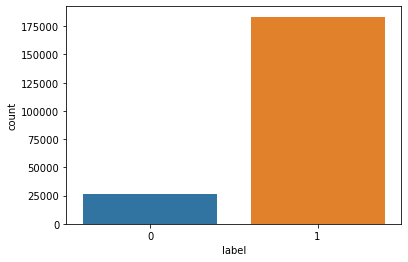

In [63]:
#plotting coutplot
sns.countplot(x='label',data=data)
plt.show()

**By looking at the plot we can see that the number of non-defaulters are more than that of defaulters in this dataset.**

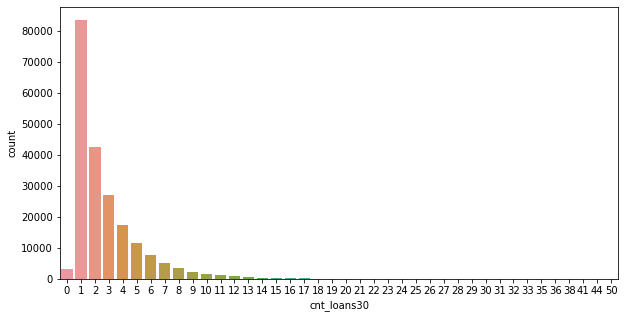

In [64]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='cnt_loans30',data=data)
plt.show()

**By looking at the plot we can see that most if the people have took loan only once in past 30 days.**

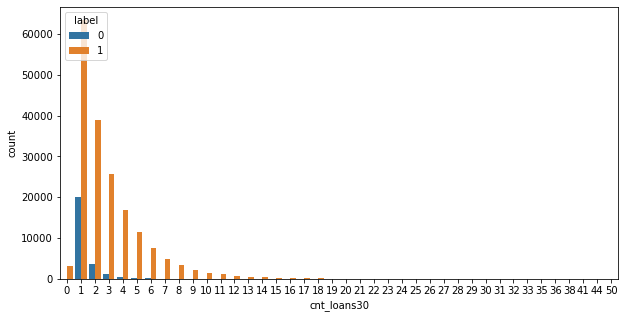

In [65]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='cnt_loans30',hue='label',data=data)
plt.show()

**By looking at the plot we can see that most of the people who took loan only once in past 30 days.Most of them have paid the loan within 5 days as compared to the ones who have not paid the loan.**

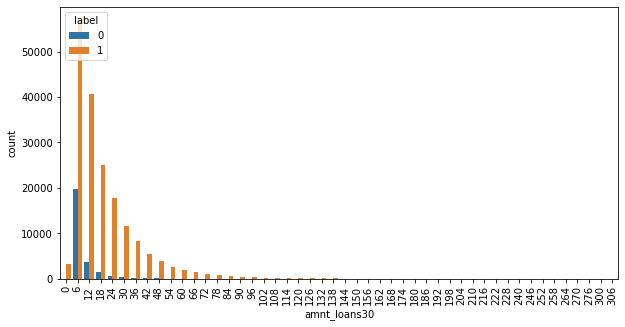

In [67]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='amnt_loans30',hue='label',data=data)
plt.xticks(rotation='vertical')
plt.show()

**By looking at the plots we can see that most of the people have took a total amount of loan that is 6(Indonesian Rupiah) in past 30 days among which most of them have paid the loan within 5 days as compared to the ones who have not paid the loan.**

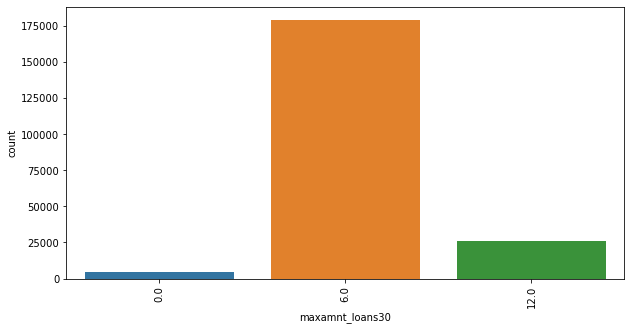

In [68]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='maxamnt_loans30',data=data)
plt.xticks(rotation='vertical')
plt.show()

**By looking at the plot we can see that most of the people have took 6(Indonesian Rupiah) as maximum amount of loan for the past 30 days.**

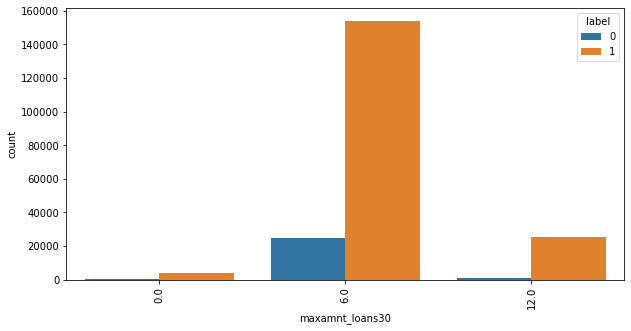

In [69]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='maxamnt_loans30',hue='label',data=data)
plt.xticks(rotation='vertical')
plt.show()

**By looking at the plot we can see that most of the people who took maximum amount of loan that is 6(Indonesian Rupiah) for the past 30 days among them most of them have paid the loan within 5 days.**

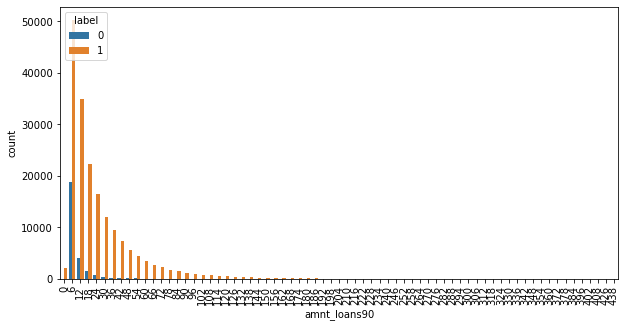

In [71]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='amnt_loans90',hue='label',data=data)
plt.xticks(rotation='vertical')
plt.show()

**By looking at the plots we can see that most of the people have took a total amount of loan that is 6(Indonesian Rupiah) in past 90 days among which most of them have paid the loan within 5 days as compared to the ones who have not paid the loan.**

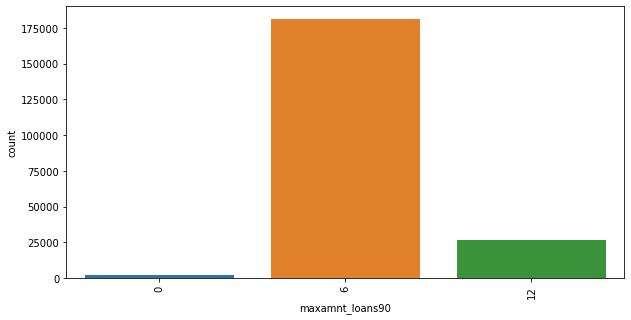

In [72]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='maxamnt_loans90',data=data)
plt.xticks(rotation='vertical')
plt.show()

**By looking at the plot we can see that most of the people have took 6(Indonesian Rupiah) as maximum amount of loan for the past 90 days.**

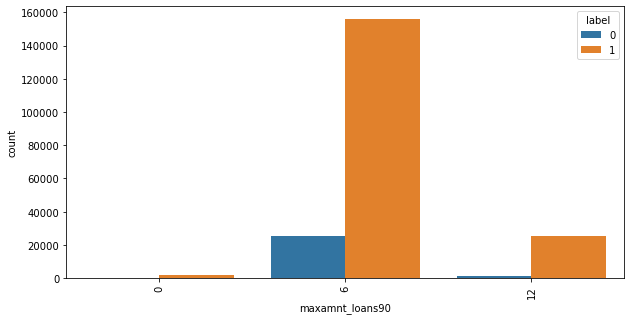

In [73]:
#plotting coutplot
plt.figure(figsize=(10,5))
sns.countplot(x='maxamnt_loans90',hue='label',data=data)
plt.xticks(rotation='vertical')
plt.show()

**By looking at the plot we can see that most of the people who took maximum amount of loan that is 6(Indonesian Rupiah) for the past 90 days among them most of them have paid the loan within 5 days.**

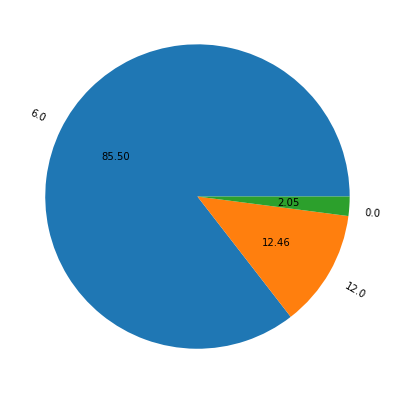

In [75]:
#plotting pie plot
plt.figure(figsize=(10,7))
labels=data['maxamnt_loans30'].unique()
plt.pie(x=data['maxamnt_loans30'].value_counts(),labels=labels,autopct='%.2f',rotatelabels=True)
plt.show()

**By looking at the plot we can see that  most of the people have took maximum amount of loan that is 6(Indonesian Rupiah) for past 30 days.**

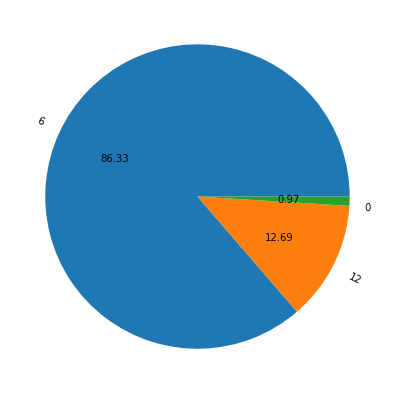

In [76]:
#plotting pie plot
plt.figure(figsize=(10,7))
labels=data['maxamnt_loans90'].unique()
plt.pie(x=data['maxamnt_loans90'].value_counts(),labels=labels,autopct='%.2f',rotatelabels=True)
plt.show()

**By looking at the plot we can see that  most of the people have took maximum amount of loan that is 6(Indonesian Rupiah) for past 90 days.**

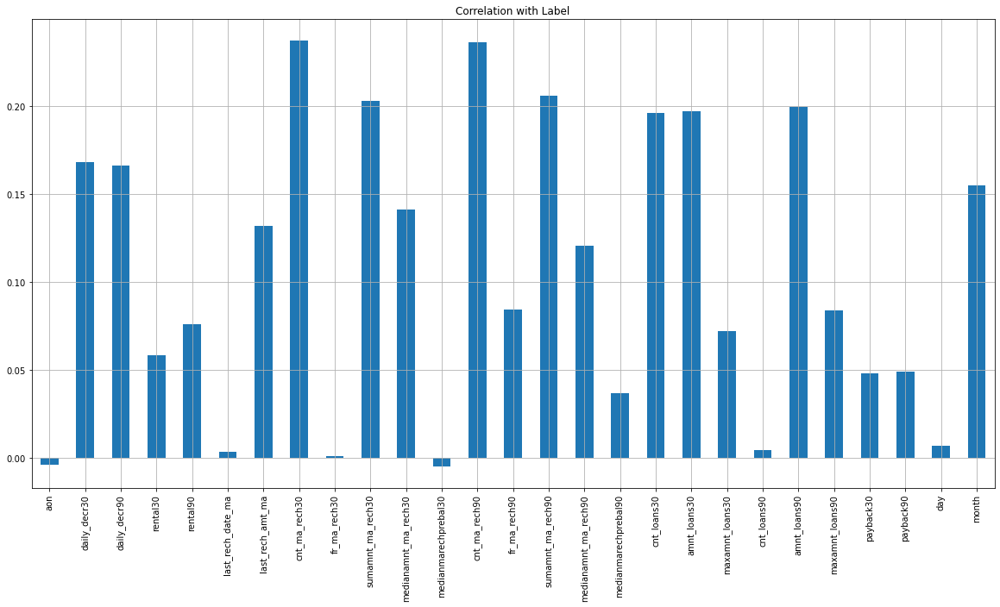

In [81]:
#Checking for correlation
data.drop(['label'],axis=1).corrwith(data['label']).plot(kind='bar',grid=True,figsize=(20,10),title='Correlation with Label')
plt.show()

**In this plot we can see that cnt_ma_rech30,sumamnt_ma_reach30,cnt_ma_rech90,sumamnt_ma_reach90 are highly correlated to the label and aon, last_reach_date_ma,fr_ma_rech30 are very least correlated to the label.**

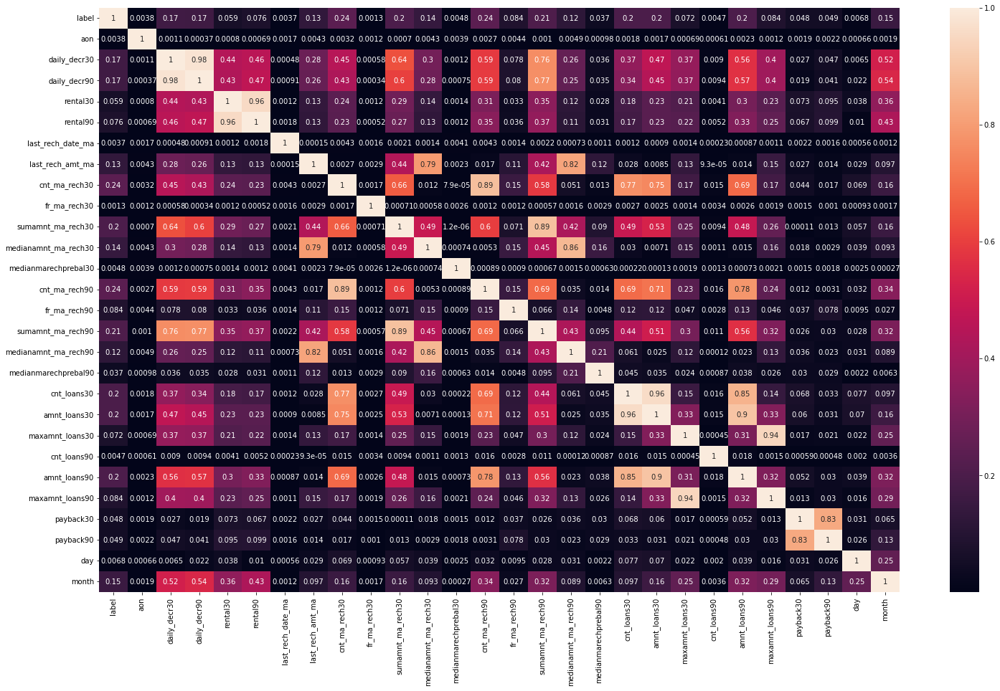

In [82]:
#Plotting heatmap
corr=data.corr().abs()
plt.figure(figsize=(25,15))
sns.heatmap(corr,annot=True)
plt.show()

**Observation**
* **In this i am considering a percenatage of 75% between the features so that they are called as multicorrelated.**
* **So by looking at the heatmap we can see in many of the features the values is more than 75% which may result in multicollinearity problem. So further using vif method to check the multicollinearity.**

In [26]:
#checking for skewness
data.skew()

label                   -2.270245
aon                     10.392926
daily_decr30             3.946235
daily_decr90             4.252567
rental30                 4.560502
rental90                 4.467271
last_rech_date_ma       14.790939
last_rech_amt_ma         3.781141
cnt_ma_rech30            3.283838
fr_ma_rech30            14.772797
sumamnt_ma_rech30        6.386774
medianamnt_ma_rech30     3.512314
medianmarechprebal30    14.779847
cnt_ma_rech90            3.425244
fr_ma_rech90             2.285415
sumamnt_ma_rech90        4.897937
medianamnt_ma_rech90     3.752696
medianmarechprebal90    45.086190
cnt_loans30              2.713426
amnt_loans30             2.975720
maxamnt_loans30          1.241873
cnt_loans90             16.594368
amnt_loans90             3.149999
maxamnt_loans90          1.678297
payback30                8.311500
payback90                6.900427
day                      0.199856
month                    0.343245
dtype: float64

**So we can see that except columns day,month and label(as we dont treat skenness of the labels)in rest all the columns skewness is present. So using power transform method to treat the skewness.** 

In [27]:
#Importing required libraries
from sklearn.preprocessing import power_transform

In [28]:
data[['aon','daily_decr30','daily_decr90','rental30','rental90','last_rech_date_ma','last_rech_amt_ma','cnt_ma_rech30','fr_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30','medianmarechprebal30','cnt_ma_rech90','fr_ma_rech90','sumamnt_ma_rech90','medianamnt_ma_rech90','medianmarechprebal90','cnt_loans30','amnt_loans30','maxamnt_loans30','cnt_loans90','amnt_loans90','maxamnt_loans90','payback30','payback90']]=power_transform(data[['aon','daily_decr30','daily_decr90','rental30','rental90','last_rech_date_ma','last_rech_amt_ma','cnt_ma_rech30','fr_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30','medianmarechprebal30','cnt_ma_rech90','fr_ma_rech90','sumamnt_ma_rech90','medianamnt_ma_rech90','medianmarechprebal90','cnt_loans30','amnt_loans30','maxamnt_loans30','cnt_loans90','amnt_loans90','maxamnt_loans90','payback30','payback90']],method='yeo-johnson')
data[['aon','daily_decr30','daily_decr90','rental30','rental90','last_rech_date_ma','last_rech_amt_ma','cnt_ma_rech30','fr_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30','medianmarechprebal30','cnt_ma_rech90','fr_ma_rech90','sumamnt_ma_rech90','medianamnt_ma_rech90','medianmarechprebal90','cnt_loans30','amnt_loans30','maxamnt_loans30','cnt_loans90','amnt_loans90','maxamnt_loans90','payback30','payback90']][:5]

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
0,-0.510570,0.492217,0.469617,-0.805171,-0.794581,-0.300490,0.083414,-0.275612,1.603296,-0.177902,0.208595,-0.605383,-0.577407,1.335397,-0.440302,0.146194,-0.827156,0.011779,-0.097558,-0.245447,-0.186801,-0.250846,-0.285612,1.813283,1.783984
1,0.410196,1.106125,1.059052,0.774496,0.614540,1.424931,1.501272,-0.799350,-1.128947,0.219814,1.632399,0.423999,-1.027903,-1.207067,-0.086683,1.682263,0.363410,-0.913014,-0.097558,2.301610,-1.034289,-0.250846,2.325822,-0.937403,-1.018914
2,0.150759,0.179857,0.165296,-0.120251,-0.216863,0.026234,0.083414,-0.799350,-1.128947,-0.535357,0.208595,0.465218,-1.027903,-1.207067,-0.760545,0.146194,0.418355,-0.913014,-0.894778,-0.245447,-1.034289,-1.005710,-0.285612,-0.937403,-1.018914
3,-0.636223,-1.124024,-1.121770,-0.937954,-0.989417,1.823792,-0.291054,-1.694154,-1.128947,-1.902186,-1.961726,-1.772123,-1.027903,-1.207067,-0.949328,-0.253804,-1.277324,0.011779,-0.097558,-0.245447,-0.186801,-0.250846,-0.285612,-0.937403,-1.018914
4,0.657940,-0.586125,-0.585936,-0.007660,-0.111529,0.259907,0.449547,0.992271,0.188869,1.262659,0.575164,0.053616,0.657800,-0.060969,0.974119,0.783546,0.010092,1.570452,1.454952,-0.245447,1.180313,1.097886,-0.285612,0.639251,0.431450


In [29]:
#checking skewness
data.skew()

label                  -2.270245
aon                    -0.298535
daily_decr30           -0.130634
daily_decr90           -0.120625
rental30               -0.040536
rental90               -0.041326
last_rech_date_ma       0.012081
last_rech_amt_ma       -0.061265
cnt_ma_rech30          -0.000144
fr_ma_rech30            0.165014
sumamnt_ma_rech30      -0.291322
medianamnt_ma_rech30   -0.189630
medianmarechprebal30   -0.027935
cnt_ma_rech90          -0.002465
fr_ma_rech90            0.142950
sumamnt_ma_rech90      -0.192160
medianamnt_ma_rech90   -0.044606
medianmarechprebal90    0.014084
cnt_loans30             0.036243
amnt_loans30            0.001947
maxamnt_loans30         0.422680
cnt_loans90             0.105583
amnt_loans90           -0.008989
maxamnt_loans90         0.364281
payback30               0.298562
payback90               0.210885
day                     0.199856
month                   0.343245
dtype: float64

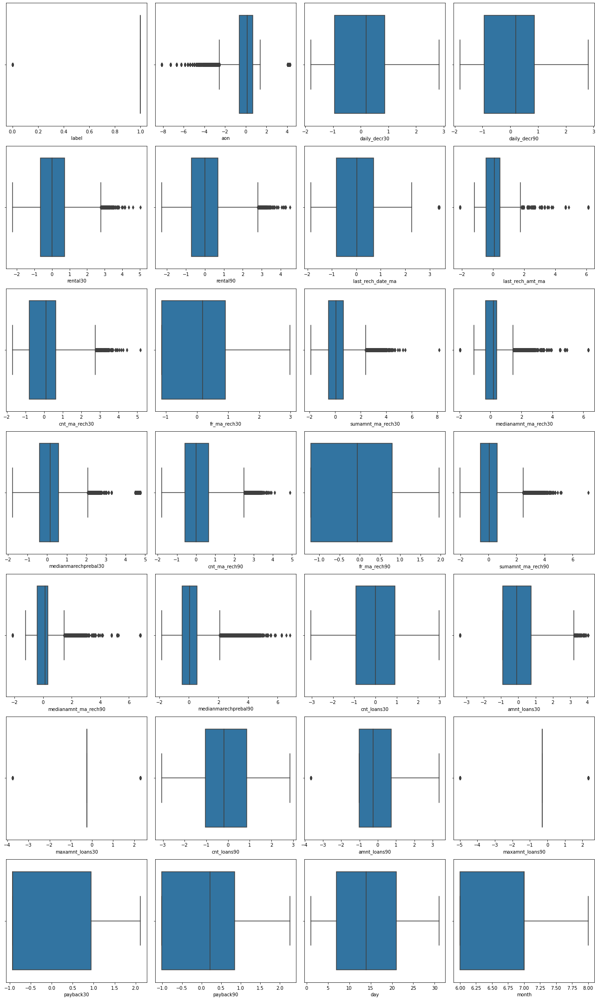

In [176]:
#plotting boxpplots
plt.figure(figsize=(18,30))
plotnumber=1
for column in data:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.tight_layout()

**By looking at the above box plots we can see that except columns daily_decr30,daily_decr90,fr_ma_rech30,fr_ma_rech90,cnt_loans30,cnt_loans90,payback30,payback90,day and month in rest all the columns outliers are present.So using z-score method to remove the outliers.**

In [31]:
#Importing required libraries
from scipy.stats import zscore

In [32]:
#Removing outliers
z_score=zscore(data[['aon','rental30','rental90','last_rech_date_ma','last_rech_amt_ma','cnt_ma_rech30','sumamnt_ma_rech30','medianamnt_ma_rech30','medianmarechprebal30','cnt_ma_rech90','sumamnt_ma_rech90','medianamnt_ma_rech90','medianmarechprebal90','amnt_loans30','maxamnt_loans30','amnt_loans90','maxamnt_loans90']])
abs_z_score=np.abs(z_score)
threshold=3
z=(abs_z_score<3).all(axis=1)

In [33]:
data[z].shape

(198475, 28)

In [34]:
data.shape

(209592, 28)

In [35]:
#Percentage Loss of Data
data_loss=((209592-198475)/209592)*100
print(f'Data Loss:{data_loss} %')

Data Loss:5.304114660864919 %


In [36]:
data=data[z]
data.shape

(198475, 28)

In [37]:
#Dividing dataset into features and label
#Features
x=data.drop(['label'],axis=1)
#Label
y=data['label']

In [38]:
#Standardiziing the data
#Importing require libraries
from sklearn.preprocessing import StandardScaler
Scaler=StandardScaler()
x_scaler=Scaler.fit_transform(x)
x_scaler

array([[-0.56650819,  0.50952078,  0.48778684, ...,  1.77130332,
         0.6616946 ,  0.29872548],
       [ 0.50562512,  1.12518414,  1.07907852, ..., -1.03291107,
        -0.52767393,  1.65998229],
       [ 0.20353792,  0.19626841,  0.18250729, ..., -1.03291107,
         0.54275775,  1.65998229],
       ...,
       [ 0.8603982 ,  1.11406683,  1.07068534, ...,  0.73978863,
         1.73212628,  0.29872548],
       [ 1.36426269,  1.13943853,  1.09577989, ...,  1.32495801,
         1.25637887,  0.29872548],
       [ 1.2815011 ,  0.67301135,  0.64861415, ..., -1.03291107,
        -0.88448449,  0.29872548]])

In [39]:
x_scaler.shape

(198475, 27)

In [185]:
#Importing require libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [186]:
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(x_scaler,i)for i in range(x_scaler.shape[1])]
vif['feature']=x.columns
vif

,vif,feature
0,1.049609,aon
1,479.966888,daily_decr30
2,541.776022,daily_decr90
3,28.956485,rental30
4,32.610327,rental90
5,2.036002,last_rech_date_ma
6,6.856512,last_rech_amt_ma
7,59.132133,cnt_ma_rech30
8,2.020746,fr_ma_rech30
9,90.714524,sumamnt_ma_rech30


**By looking at the above results most of the features values are more than 5 which means that they are multicorrelated.So using PCA technique as it take care of multicollinearity problem.** 

In [40]:
#Importing required libraries
from sklearn.decomposition import PCA

In [41]:
pca=PCA()
pca.fit_transform(x_scaler)

array([[ 2.30136207e-01, -5.13278311e-01, -9.51677355e-01, ...,
         3.64486161e-02,  2.04924835e-02,  1.08484934e-02],
       [ 1.01036197e+00,  3.01187645e+00,  4.66717098e+00, ...,
         1.08070452e-01, -2.87003907e-02, -1.80651448e-02],
       [-2.10114027e+00,  1.51570576e+00,  1.67566848e+00, ...,
        -1.41293506e-02,  5.17605919e-03, -2.72467258e-02],
       ...,
       [ 4.44122525e+00, -1.28155050e+00,  1.68508175e+00, ...,
         7.76639122e-02, -7.39286368e-02, -2.36501601e-02],
       [ 2.55199861e+00,  7.54947318e-02,  1.86956528e+00, ...,
        -1.17236940e-01, -1.35487239e-01, -7.47765534e-03],
       [ 2.38788531e+00,  3.68689167e+00,  2.12095549e+00, ...,
        -1.11119941e-01, -5.49239369e-02,  3.57664528e-03]])

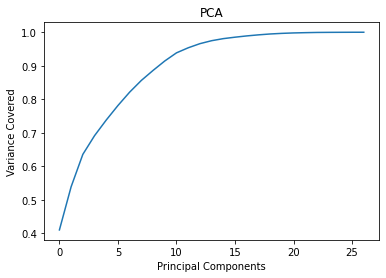

In [189]:
#Plotting scree plot to check the best components
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()

**Around 19 principal components are able to explain more than 95% variance. So its safe to consider starting 19 PC's.**

In [42]:
pca=PCA(n_components=19)
new_data=pca.fit_transform(x_scaler)
princi_comp=pd.DataFrame(new_data,columns=['pc1','pc2','pc3','pc4','pc5','pc6','pc7','pc8','pc9','pc10','pc11','pc12','pc13','pc14','pc15','pc16','pc17','pc18','pc19'])
princi_comp[:5]

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18,pc19
0,0.230136,-0.513278,-0.951677,-1.265504,-2.793844,-0.116905,-0.205908,1.086286,0.696117,-0.737281,1.460407,-0.541767,-0.046083,-0.010312,-0.506414,-0.041041,-0.010709,-0.113260,0.005519
1,1.010362,3.011876,4.667171,1.752091,0.178174,-0.227716,1.500659,-0.065764,0.280145,0.853747,0.681345,0.209583,0.679512,-0.814081,-0.465052,0.380376,0.053489,-0.169527,0.048952
2,-2.101140,1.515706,1.675668,-0.704292,1.299485,-0.165336,0.206959,-0.814901,0.567397,-0.546289,1.214056,0.315300,0.445383,-0.373664,-0.105122,0.989108,0.006952,-0.260364,0.045844
3,-4.396807,-0.624606,0.092198,0.443957,0.411151,-0.623769,1.909980,1.523120,1.163354,0.521128,-2.084986,-0.126125,0.620387,0.418523,-0.072827,-0.337949,-0.087736,0.102942,-0.583505
4,2.486374,-0.457364,-2.559560,0.958864,0.406469,0.746009,1.385460,0.056111,-0.586828,-0.224137,-0.478808,0.146199,0.147788,-0.032900,-0.002382,0.156955,0.285771,-0.207221,-0.062399


# While going through the plots we had seen that the data of label was not balanced. So using smote technique to balance the data of the label.

In [43]:
#Using oversampling method-Smote method
#importing required libraries
from imblearn.over_sampling import SMOTE

In [44]:
over_samp=SMOTE()

In [45]:
x_new,y_new=over_samp.fit_resample(princi_comp,y)

In [46]:
print('The number of classes before fit {}'.format(y.value_counts()))

The number of classes before fit 1    173466
0     25009
Name: label, dtype: int64


In [47]:
print('The number of classes after fit {}'.format(y_new.value_counts()))

The number of classes after fit 0    173466
1    173466
Name: label, dtype: int64


**So now we can see that the data is balanced.**

In [77]:
#Importing required libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,roc_auc_score,plot_roc_curve,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.svm import SVC

**Xtreme Gradient Regressor**

In [308]:
xgb=xgb.XGBClassifier()

In [198]:
#using range fucntion to find the best random state using Random Forest Classifier
for i in range(0,10):
    x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=i)
    xgb.fit(x_train,y_train)
    pred=xgb.predict(x_train)
    y_pred=xgb.predict(x_test)
    print(f'at random state{i},the training accuracy is:{accuracy_score(y_train,pred)*100}')
    print(f'at random state{i},the testing accuracy is:{accuracy_score(y_test,y_pred)*100}')
    print('\n')

at random state0,the training accuracy is:89.0253229259144
at random state0,the testing accuracy is:87.37965941452504


at random state1,the training accuracy is:88.94922732216496
at random state1,the testing accuracy is:87.46151983674034


at random state2,the training accuracy is:88.8642923301012
at random state2,the testing accuracy is:87.50994431185362


at random state3,the training accuracy is:89.00995007667208
at random state3,the testing accuracy is:87.45921390935399


at random state4,the training accuracy is:88.76974930726098
at random state4,the testing accuracy is:87.1744318771402


at random state5,the training accuracy is:89.05030380593315
at random state5,the testing accuracy is:87.50994431185362


at random state6,the training accuracy is:89.0153305739069
at random state6,the testing accuracy is:87.43154278071783


at random state7,the training accuracy is:89.06298640655805
at random state7,the testing accuracy is:87.38888312407043


at random state8,the training accura

**Taking Random State as 8**

In [78]:
#instantiating the model
xgb=xgb.XGBClassifier()

In [50]:
#Training Testing and Spliting the data
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=8)

In [51]:
#Building Model to test unexposed data
def metric_score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        pred=clf.predict(x_train)
        print('\n=====Train Score=====')
        print(f'Accuracy Score:{accuracy_score(y_train,pred)*100:.2f}%')
    elif train==False:
        y_pred=clf.predict(x_test)
        print('\n=====Test Score=====')
        print(f'Accuracy Score:{accuracy_score(y_test,y_pred)*100:.2f}%')
        print('\n Test Classification Report:\n',classification_report(y_test,y_pred,digits=2))
        print('\n Confusion Matrix:\n',confusion_matrix(y_test,y_pred))
        print('\n F1 Score:\n',f1_score(y_test,y_pred))
        print('\n roc_auc_score:\n',roc_auc_score(y_test,y_pred))

In [314]:
#Training the data
xgb.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [315]:
#calling the function and passing the dataset for logistic regression
metric_score(xgb,x_train,x_test,y_train,y_test,train=True)#for training
metric_score(xgb,x_train,x_test,y_train,y_test,train=False)#for testing


=====Train Score=====
Accuracy Score:89.06%

=====Test Score=====
Accuracy Score:87.54%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.88      0.88     43242
           1       0.88      0.87      0.87     43491

    accuracy                           0.88     86733
   macro avg       0.88      0.88      0.88     86733
weighted avg       0.88      0.88      0.88     86733


 Confusion Matrix:
 [[38226  5016]
 [ 5790 37701]]

 F1 Score:
 0.8746520044543429

 roc_auc_score:
 0.8754353362143538


In [70]:
#Checking Cross Validation score
#Importing required libraries
from sklearn.model_selection import cross_val_score

In [213]:
y_pred=xgb.predict(x_test)
test_accuracy=accuracy_score(y_test,y_pred)

In [214]:
#Checking cross validation score
for j in range(2,6):
    cv_score=cross_val_score(xgb,x_new,y_new,cv=j)
    cv_mean=cv_score.mean()
    print(f'at cross fold {j} the cv score is{cv_mean}and accuracy for the testing is {test_accuracy}')
    print('\n')

at cross fold 2 the cv score is0.8724591562611693and accuracy for the testing is 0.875410743315693


at cross fold 3 the cv score is0.8741828369824635and accuracy for the testing is 0.875410743315693


at cross fold 4 the cv score is0.8734132337172702and accuracy for the testing is 0.875410743315693


at cross fold 5 the cv score is0.8749322840643565and accuracy for the testing is 0.875410743315693




**Taking cv=5.**

**ADA Boost**

In [240]:
#instantiatiating the model
ada=AdaBoostClassifier()

In [241]:
#Training Testing and Spliting the data
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=8)

In [242]:
#Training the data
ada.fit(x_train,y_train)

AdaBoostClassifier()

In [243]:
#calling the function and passing the dataset for gradient boosting
metric_score(ada,x_train,x_test,y_train,y_test,train=True)#for training
metric_score(ada,x_train,x_test,y_train,y_test,train=False)#for testing


=====Train Score=====
Accuracy Score:78.98%

=====Test Score=====
Accuracy Score:79.18%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.80      0.79     43242
           1       0.80      0.79      0.79     43491

    accuracy                           0.79     86733
   macro avg       0.79      0.79      0.79     86733
weighted avg       0.79      0.79      0.79     86733


 Confusion Matrix:
 [[34521  8721]
 [ 9333 34158]]

 F1 Score:
 0.7909690864883641

 roc_auc_score:
 0.7918624766975466


In [224]:
#Checking cross validation score
cv_score=cross_val_score(ada,x_new,y_new,cv=5).mean()
cv_score

0.7894284876596002

**Gradient Boosting**

In [244]:
#instantiatiating the model
gb=GradientBoostingClassifier()

In [245]:
#Training Testing and Spliting the data
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=8)

In [246]:
#Training the data
gb.fit(x_train,y_train)

GradientBoostingClassifier()

In [247]:
#calling the function and passing the dataset for gradient boosting
metric_score(gb,x_train,x_test,y_train,y_test,train=True)#for training
metric_score(gb,x_train,x_test,y_train,y_test,train=False)#for testing


=====Train Score=====
Accuracy Score:82.75%

=====Test Score=====
Accuracy Score:82.84%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.81      0.83     43242
           1       0.82      0.84      0.83     43491

    accuracy                           0.83     86733
   macro avg       0.83      0.83      0.83     86733
weighted avg       0.83      0.83      0.83     86733


 Confusion Matrix:
 [[35159  8083]
 [ 6804 36687]]

 F1 Score:
 0.831329805916543

 roc_auc_score:
 0.8283145448193586


In [248]:
#Checking cross validation score
cv_score=cross_val_score(gb,x_new,y_new,cv=5).mean()
cv_score

0.8246140584887834

**Random Forest**

In [64]:
#instantiatiating the model
rfc=RandomForestClassifier()

In [65]:
#Training Testing and Spliting the data
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=8)

In [66]:
#Training the data
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [252]:
#calling the function and passing the dataset for gradient boosting
metric_score(rfc,x_train,x_test,y_train,y_test,train=True)#for training
metric_score(rfc,x_train,x_test,y_train,y_test,train=False)#for testing


=====Train Score=====
Accuracy Score:100.00%

=====Test Score=====
Accuracy Score:93.86%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94     43242
           1       0.95      0.93      0.94     43491

    accuracy                           0.94     86733
   macro avg       0.94      0.94      0.94     86733
weighted avg       0.94      0.94      0.94     86733


 Confusion Matrix:
 [[41159  2083]
 [ 3245 40246]]

 F1 Score:
 0.9379165695642042

 roc_auc_score:
 0.9386080508700946


In [253]:
#Checking cross validation score
cv_score=cross_val_score(rfc,x_new,y_new,cv=5).mean()
cv_score

0.9410345536625926

**Decision Tree Classifier**

In [259]:
#instantiatiating the model
dt=DecisionTreeClassifier()

In [260]:
#Training Testing and Spliting the data
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=8)

In [261]:
#Training the data
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [262]:
#calling the function and passing the dataset for gradient boosting
metric_score(dt,x_train,x_test,y_train,y_test,train=True)#for training
metric_score(dt,x_train,x_test,y_train,y_test,train=False)#for testing


=====Train Score=====
Accuracy Score:100.00%

=====Test Score=====
Accuracy Score:87.88%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.90      0.88     43242
           1       0.89      0.86      0.88     43491

    accuracy                           0.88     86733
   macro avg       0.88      0.88      0.88     86733
weighted avg       0.88      0.88      0.88     86733


 Confusion Matrix:
 [[38827  4415]
 [ 6098 37393]]

 F1 Score:
 0.8767511928627534

 roc_auc_score:
 0.8788436360076566


In [263]:
#Checking cross validation score
cv_score=cross_val_score(dt,x_new,y_new,cv=5).mean()
cv_score

0.8808296697763927

**Logistic Regression**

In [265]:
#instantiatiating the model
lr=LogisticRegression()

In [266]:
#Training Testing and Spliting the data
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=8)

In [267]:
#Training the data
lr.fit(x_train,y_train)

LogisticRegression()

In [268]:
#calling the function and passing the dataset for gradient boosting
metric_score(lr,x_train,x_test,y_train,y_test,train=True)#for training
metric_score(lr,x_train,x_test,y_train,y_test,train=False)#for testing


=====Train Score=====
Accuracy Score:76.81%

=====Test Score=====
Accuracy Score:77.11%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.78      0.77     43242
           1       0.78      0.76      0.77     43491

    accuracy                           0.77     86733
   macro avg       0.77      0.77      0.77     86733
weighted avg       0.77      0.77      0.77     86733


 Confusion Matrix:
 [[33749  9493]
 [10364 33127]]

 F1 Score:
 0.76940228309972

 roc_auc_score:
 0.7710829429974103


In [269]:
#Checking cross validation score
cv_score=cross_val_score(lr,x_new,y_new,cv=5).mean()
cv_score

0.768813492055693

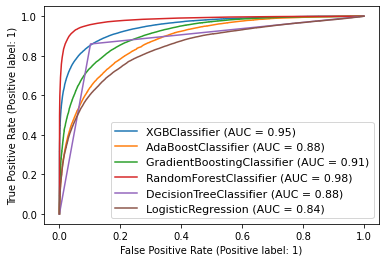

In [270]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

disp =plot_roc_curve(xgb, x_test, y_test)# ax_=Axes with confusion matrix
plot_roc_curve(ada, x_test, y_test, ax=disp.ax_)
plot_roc_curve(gb, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rfc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(dt, x_test, y_test, ax=disp.ax_)
plot_roc_curve(lr,x_test,y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

**I have generated the ROC Curve for all the models used here and it shows the AUC score for the models.**

In [330]:
#Making dataframe of all the models
data=pd.DataFrame({
    'Models':['XGB','Ada Boost','Gradient Boosting','Random Forest','Decision Tree','Logistic Regression'],
    'Training Score':[89.06,78.98,82.75,100,100,76.81],
    'Testing Score':[87.54,79.18,82.84,93.86,87.88,77.11],
    'Cross Val Score':[87.49,78.94,84.46,94.10,88.08,76.88],
    'F1 score':[87.54,79.09,83.13,93.79,87.67,76.94]
})
data

,Models,Training Score,Testing Score,Cross Val Score,F1 score
0,XGB,89.06,87.54,87.49,87.54
1,Ada Boost,78.98,79.18,78.94,79.09
2,Gradient Boosting,82.75,82.84,84.46,83.13
3,Random Forest,100.00,93.86,94.10,93.79
4,Decision Tree,100.00,87.88,88.08,87.67
5,Logistic Regression,76.81,77.11,76.88,76.94


**Observation**
* **By looking above results, we can see that Random forest and Decision tree have seen most of the data but the testing score of the Random forest is more than that of decision tree.**
* **Cross validation and f1 score is very close to the testing score of random forest.**
* **AUC score of the random forest is highest that 98%.**
* **Most important, the True positive and True Negative of random forest have highest values among other models and False postive and False Negative have lesser values than other models.**
* **So becuase of this above reasons i am going forward with Random Forest Classifier Model.**

In [52]:
#Using Grid Search cv for hyperparameter tuning for Random Forest
from sklearn.model_selection import GridSearchCV

In [53]:
param_grid=({
    'n_estimators': [100,150],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [2,4,6],
    'criterion' :['gini', 'entropy']
})

In [57]:
grid_search=GridSearchCV(rfc,param_grid=param_grid,cv=5)

In [59]:
#Training
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 150]})

In [60]:
#best Parameters
grid_search.best_params_ 

{'criterion': 'gini',
 'max_depth': 6,
 'max_features': 'log2',
 'n_estimators': 150}

In [62]:
#Training with the best parameters
rfc1=RandomForestClassifier(criterion='gini',max_depth=6,max_features='log2',n_estimators=150)
rfc1.fit(x_train,y_train)

RandomForestClassifier(max_depth=6, max_features='log2', n_estimators=150)

In [68]:
#calling the function and passing the dataset
metric_score(rfc1,x_train,x_test,y_train,y_test,train=True)#Training Score
metric_score(rfc1,x_train,x_test,y_train,y_test,train=False)#Testing Score


=====Train Score=====
Accuracy Score:80.21%

=====Test Score=====
Accuracy Score:80.48%

 Test Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.75      0.79     43242
           1       0.78      0.86      0.81     43491

    accuracy                           0.80     86733
   macro avg       0.81      0.80      0.80     86733
weighted avg       0.81      0.80      0.80     86733


 Confusion Matrix:
 [[32614 10628]
 [ 6299 37192]]

 F1 Score:
 0.8146225536901359

 roc_auc_score:
 0.8046929351822851


In [71]:
#Checking cross validation score
cv_score=cross_val_score(rfc1,x_new,y_new,cv=5)
cv_mean=cv_score.mean()
cv_mean

0.8020476626202242

**After doing hyper parameter tuning the training testing and cross validation score is reduced. So i am saving the model on which hyperparamter tuning was not done.**

In [72]:
#saving the model
#Importing required libraries
import pickle
pickle.dump(rfc,open('Micro Credit Project','wb'))

**Loading and predicting the saved model**

In [73]:
#Loading the saved model
model=pickle.load(open('Micro Credit Project','rb'))

In [74]:
#Prediction
prediction=model.predict(x_test)
prediction

array([1, 0, 0, ..., 1, 1, 0], dtype=int64)

In [75]:
#This are the predicted prices of the flight tickets
Predicted_micro_credit=pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=['Predicted','Actual'])
Predicted_micro_credit

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021